In [20]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize
import jax
from jax import grad, jit
import jax.numpy as jnp
jax.config.update("jax_enable_x64", True)
from utils import *

In [21]:
def comp_pdf(x, mu, Sigma):
    det = jnp.linalg.det(Sigma)
    inv = jnp.linalg.inv(Sigma)
    diff = x - mu
    exponent = -0.5*jnp.sum(diff@inv*diff, axis=1)
    norm_const = 1.0/(2*jnp.pi*jnp.sqrt(det))
    return norm_const*jnp.exp(exponent)

def expensive_log_likelihood(obs, params, weights=None):
    mu_params, s_params = params
    n_components = mu_params.shape[0]

    if s_params.ndim == 2:  
        s_params = jnp.array([jnp.diag(s) for s in s_params])
        
    # equal weights
    if weights is None:
        weights = jnp.ones(n_components)/n_components
    else:
        weights = jnp.array(weights)/jnp.sum(weights)

    terms = jnp.stack([comp_pdf(obs, mu_params[i], s_params[i]) for i in range(n_components)], axis=1)
    likelihood = jnp.sum(weights*terms, axis=1)
    log_likelihood = jnp.log(likelihood + 1e-12)
    return log_likelihood


Optimised params: [19.87668174 20.         20.        ]
Optimised log marginal likelihood: -17.278804369467295


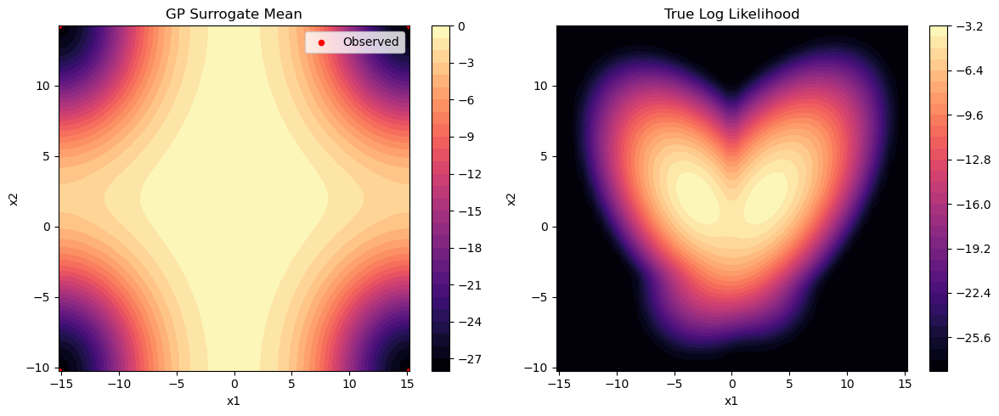

In [100]:

# true parameters for 2D mixture
n = 2
# mu_true = jnp.array([[-14, 2], [0, 10], [15, -5]])
# s_true = jnp.array([[[2.3, 1.1],[1.1, 2.3]], 
#                     [[2.6, -1.4],[-1.4, 2.6]], 
#                     [[3.0, 0.5], [0.5, 3.0]]])
# s_true = jnp.array([[2.3, 2.1],
#                     [2.6, 2.4],
#                     [3.0, 2.5]])
mu_true = jnp.array([[-3, 2],[3, 2]])
s_true = jnp.array([[[2.3, -1.1],[-1.1, 2.3]],
                    [[2.6, 1.4],[1.4, 2.6]]])


params_true = (mu_true, s_true)

# per-dimension bounds
lower1 = jnp.min(mu_true[:,0]) - 5*jnp.mean(s_true[:,0,0])
upper1 = jnp.max(mu_true[:,0]) + 5*jnp.mean(s_true[:,0,0])
lower2 = jnp.min(mu_true[:,1]) - 5*jnp.mean(s_true[:,1,1])
upper2 = jnp.max(mu_true[:,1]) + 5*jnp.mean(s_true[:,1,1])
# lower1 = jnp.min(mu_true[:,0]) - 6*jnp.mean(s_true[:,0])
# upper1 = jnp.max(mu_true[:,0]) + 6*jnp.mean(s_true[:,0])
# lower2 = jnp.min(mu_true[:,1]) - 6*jnp.mean(s_true[:,1])
# upper2 = jnp.max(mu_true[:,1]) + 6*jnp.mean(s_true[:,1])



# grid of evaluation points
x1 = jnp.linspace(lower1, upper1, n)
x2 = jnp.linspace(lower2, upper2, n)
X1, X2 = jnp.meshgrid(x1, x2)
x = jnp.column_stack([X1.ravel(), X2.ravel()])




y = expensive_log_likelihood(x, params_true)

# GP fit
grad_fn = grad(neg_gp_likelihood)
s_init = 5
l_init = jnp.array([10, 10])
init_params = jnp.concatenate([jnp.array([s_init]), l_init])

res = minimize(
    fun=lambda p: float(neg_gp_likelihood(p, x, y, rbf)),
    x0=init_params,
    jac=lambda p: jnp.array(grad_fn(p, x, y, rbf)),
    method="L-BFGS-B",
    bounds=[(1, 20)]*len(init_params)
)

# kernel hyperparameters
s = res.x[0]
L = jnp.diag(res.x[1:])
L = jnp.array([5, 5])
print("Optimised params:", res.x)
print("Optimised log marginal likelihood:", -res.fun)

# dense evaluation grid
x1_eval = jnp.linspace(lower1, upper1, 40)
x2_eval = jnp.linspace(lower2, upper2, 40)
X1_eval, X2_eval = jnp.meshgrid(x1_eval, x2_eval)
x_eval = jnp.column_stack([X1_eval.ravel(), X2_eval.ravel()])


mu_eval, var_eval = gp_predict(x, y, x_eval, kernel=rbf, s=s, L=L)
sig_diag = jnp.sqrt(jnp.diag(var_eval))

# reshape for contour plotting
mu_eval_grid = mu_eval.reshape(X1_eval.shape)
log_likelihood_true = expensive_log_likelihood(x_eval, params_true).reshape(X1_eval.shape)

# plot GP mean vs true log likelihood
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
cs = plt.contourf(X1_eval, X2_eval, mu_eval_grid, levels=30, cmap="magma")
plt.colorbar(cs)
plt.ylim(lower2,upper2)
plt.xlim(lower1,upper1)
plt.scatter(x[:,0], x[:,1], c='red', s=20, label='Observed')
plt.title("GP Surrogate Mean")
plt.xlabel("x1")
plt.ylabel("x2")
plt.legend()

plt.subplot(1, 2, 2)
cs2 = plt.contourf(X1_eval, X2_eval, log_likelihood_true, levels=30, cmap="magma")
plt.colorbar(cs2)
plt.ylim(lower2,upper2)
plt.xlim(lower1,upper1)
plt.title("True Log Likelihood")
plt.xlabel("x1")
plt.ylabel("x2")

plt.tight_layout()
plt.show()




x1_eval = jnp.linspace(lower1, upper1, 30)
x2_eval = jnp.linspace(lower2, upper2, 30)
X1_eval, X2_eval = jnp.meshgrid(x1_eval, x2_eval)
x_eval = jnp.column_stack([X1_eval.ravel(), X2_eval.ravel()])

# Compute the real log likelihood on the grid
real_log_likelihood = expensive_log_likelihood(x_eval, params_true)
real_log_likelihood = real_log_likelihood.reshape(X1_eval.shape)


In [95]:
#multimodal gaussian mixture pdf
def mixture_pdf(x, mu_params, s_params, weights=None):
    x = jnp.atleast_2d(x)
    mu_params = jnp.array(mu_params)
    s_params = jnp.array(s_params)
    n_components = mu_params.shape[0]

    #assume equal weights
    if weights is None:
        weights = jnp.ones(n_components)/n_components
    else:
        weights = jnp.array(weights)/jnp.sum(weights)

    if s_params.ndim == 2:
        s_params = jnp.array([jnp.diag(s) for s in s_params])

    terms = jnp.stack([comp_pdf(x, mu_params[i], s_params[i]) for i in range(n_components)], axis=1)
    return jnp.sum(weights[None, :] * terms, axis=1)


#MC estimate of entropy of a multimodal bivariate gaussian
def entropy(params, weights=None, key=None, random=True):
    mu_params = jnp.array(params[0])
    s_params = jnp.array(params[1])
    n_components = len(mu_params)
    key1, key2 = jax.random.split(key)

    if s_params.ndim == 2:
        s_params = jnp.array([jnp.diag(s) for s in s_params])

    #assume equal weights
    if weights is None:
        weights = jnp.ones(n_components)/n_components
    else:
        weights = jnp.array(weights)/jnp.sum(weights)

    n_samples = 75 if random else 100_000

    #sample from mixture
    mix = jax.random.choice(key1, n_components, shape=(n_samples,), p=weights)
    z = jax.random.normal(key2, shape=(n_samples, 2))
    #transform samples
    Ls = jnp.linalg.cholesky(s_params)
    samples = jax.vmap(lambda L, mu, z: mu + L @ z)(Ls[mix], mu_params[mix], z)

    #compute pdf at sampled points
    pdf_vals = jax.vmap(lambda x: mixture_pdf(x, mu_params, s_params, weights))(samples)

    #return entropy
    h = -jnp.log(pdf_vals + 1e-12)
    return jnp.mean(h)


def log_joint(x_eval, y_eval, s, L, params, weights=None):
    mu_params = jnp.array(params[0])              # (n_components, d)
    S_params = jnp.array([jnp.diag(s) for s in params[1]])  # (n_components, d, d)
    n_components, d = mu_params.shape

    x_eval = jnp.atleast_2d(x_eval).astype(jnp.float64)     # (n_eval, d)
    y_eval = jnp.atleast_2d(y_eval).reshape(-1, 1)          # (n_eval, 1)
    n_eval = x_eval.shape[0]

    if L.ndim == 1:
        L = jnp.diag(L)

    # default to equal weights
    if weights is None:
        weights = jnp.ones(n_components) / n_components
    else:
        weights = jnp.array(weights) / jnp.sum(weights)

    # GP covariance matrix


    Kxx = rbf(x_eval, x_eval, s, L)
    Kxx += 1e-10*jnp.eye(n_eval)
    

    # vectorised evaluation of vk2 for each component
    def comp_vals(mu_j, S_j):
        # vk2 must return scalar for a single x point
        return jax.vmap(lambda xi: vk2(xi, s, L, mu_j, S_j))(x_eval).reshape(-1)

    kFs = jnp.stack([comp_vals(mu_params[j], S_params[j])
                     for j in range(n_components)], axis=1)   # (n_eval, n_components)

    # weighted sum across components → (n_eval,1)
    kF = (weights[None, :] * kFs).sum(axis=1).reshape(-1, 1)

    # GP posterior mean
    sol_y = jnp.linalg.solve(Kxx, y_eval)   # (n_eval,1)
    mu = (kF.T @ sol_y).squeeze()           # scalar

    return mu


def elbo(params, x, y, s=1, L=1, key=None, random=True):
    #convert parameters to appropriate form
    mixture_params = (params[0], jnp.exp(params[1]))

    #compute expected log joint
    expected_log_joint = log_joint(x, y, s, L, mixture_params)

    #entropy of Gaussian q
    entropy_q = entropy(mixture_params, weights=None,key=key, random=random)

    #return negative elbo
    return -expected_log_joint - entropy_q


def vbmc1(x, y, params, grad_elbo, s=5, L=5, lr=0.005, n1=10, n2=20_000, key=None, plots=False):
    elbo_history = []
    best_elbo = -jnp.inf
    best_params = params.copy()
    for j in range(n1):
        for i in range(n2):
            key, _ = jax.random.split(key)
            grads = grad_elbo(params, x, y, s, L, key=key)
            params = params - lr*grads

            if (i+1) % (n2/2) == 0:
                current_elbo = -elbo(params, x, y, s, L, key=key, random=False)
                elbo_history.append(current_elbo)
                if current_elbo > best_elbo:
                    best_elbo = current_elbo
                    best_params = params.copy()
                print(f"Iter {j+1}, {i+1}: ELBO = {current_elbo}")

        if plots:
            mu_opt = params[0]
            s_opt = jnp.exp(params[1])

            lower1 = jnp.min(mu_opt[:,0]) - 3*jnp.mean(s_opt[:,0])
            upper1 = jnp.max(mu_opt[:,0]) + 3*jnp.mean(s_opt[:,0])
            lower2 = jnp.min(mu_opt[:,1]) - 3*jnp.mean(s_opt[:,1])
            upper2 = jnp.max(mu_opt[:,1]) + 3*jnp.mean(s_opt[:,1])
            
            # Grid for evaluation
            x1_eval = jnp.linspace(lower1, upper1, 40)
            x2_eval = jnp.linspace(lower2, upper2, 40)
            X1_eval, X2_eval = jnp.meshgrid(x1_eval, x2_eval)
            x_eval = jnp.column_stack([X1_eval.ravel(), X2_eval.ravel()])

            # Estimated mixture PDF
            pdf_vals = jax.vmap(lambda x: mixture_pdf(x, mu_params=mu_opt, s_params=s_opt))(x_eval)
            pdf_vals_grid = pdf_vals.reshape(X1_eval.shape)

            # True PDF
            true_pdf_vals = jnp.exp(expensive_log_likelihood(x_eval, params_true))
            true_pdf_vals /= jnp.trapezoid(jnp.trapezoid(true_pdf_vals.reshape(X1_eval.shape), x2_eval), x1_eval)
            true_pdf_vals_grid = true_pdf_vals.reshape(X1_eval.shape)



            # Plots
            plt.figure(figsize=(12,5))

            # Estimated Posterior
            plt.subplot(1, 2, 1)
            cs = plt.contourf(X1_eval, X2_eval, pdf_vals_grid, levels=30, cmap="Oranges")
            plt.contour(X1_eval, X2_eval, pdf_vals_grid, levels=30, colors="black", linewidths=0.5)
            plt.colorbar(cs)
            plt.ylim(lower2, upper2)
            plt.xlim(lower1, upper1)
            plt.title("Estimated Posterior Density")
            plt.xlabel("x1")
            plt.ylabel("x2")

            # True Distribution
            plt.subplot(1, 2, 2)
            cs2 = plt.contourf(X1_eval, X2_eval, true_pdf_vals_grid, levels=30, cmap="Oranges")
            plt.contour(X1_eval, X2_eval, true_pdf_vals_grid, levels=30, colors="black", linewidths=0.5)
            plt.colorbar(cs2)
            plt.ylim(lower2, upper2)
            plt.xlim(lower1, upper1)
            plt.title("True Distribution")
            plt.xlabel("x1")
            plt.ylabel("x2")

            plt.tight_layout()
            plt.show()

    return best_params, best_elbo, elbo_history




Iter 1, 2000: ELBO = -1.6213707921519624
Iter 1, 4000: ELBO = -0.6087638832989528


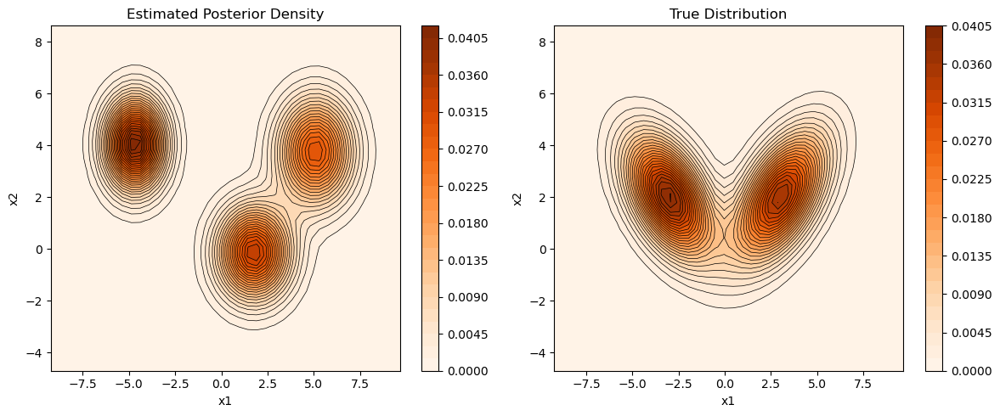

Iter 2, 2000: ELBO = -0.25630073210848714
Iter 2, 4000: ELBO = -0.12882513601334544


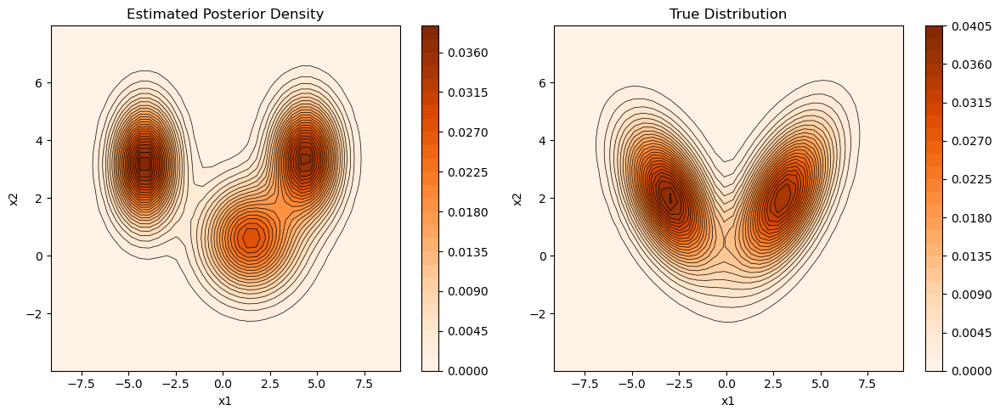

Iter 3, 2000: ELBO = -0.0658809733700032
Iter 3, 4000: ELBO = -0.049967628939994846


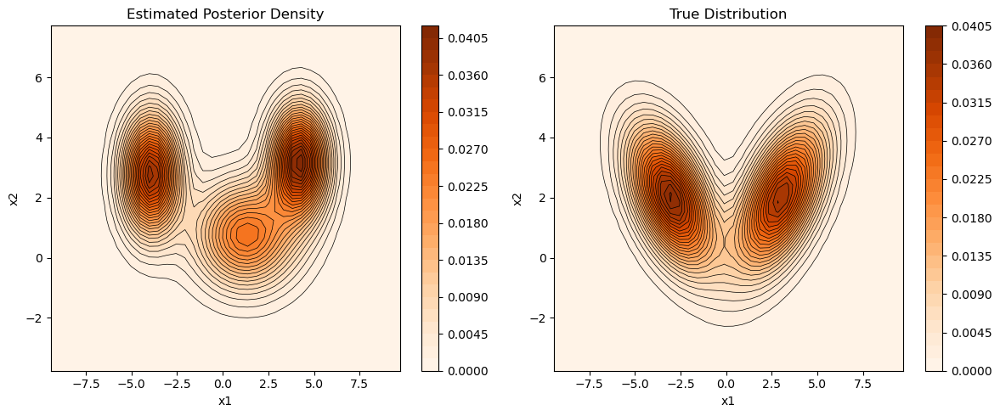

Iter 4, 2000: ELBO = -0.03984158291760931
Iter 4, 4000: ELBO = -0.03590845385147201


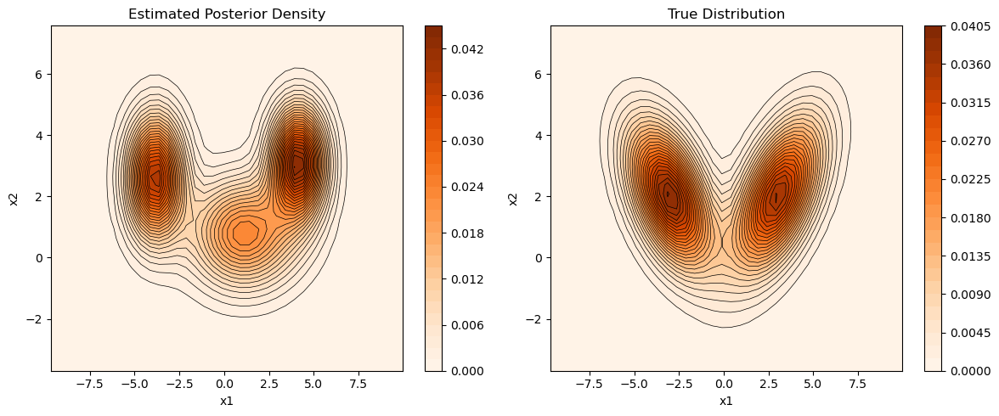

Iter 5, 2000: ELBO = -0.0272573238871745
Iter 5, 4000: ELBO = -0.023058367665587554


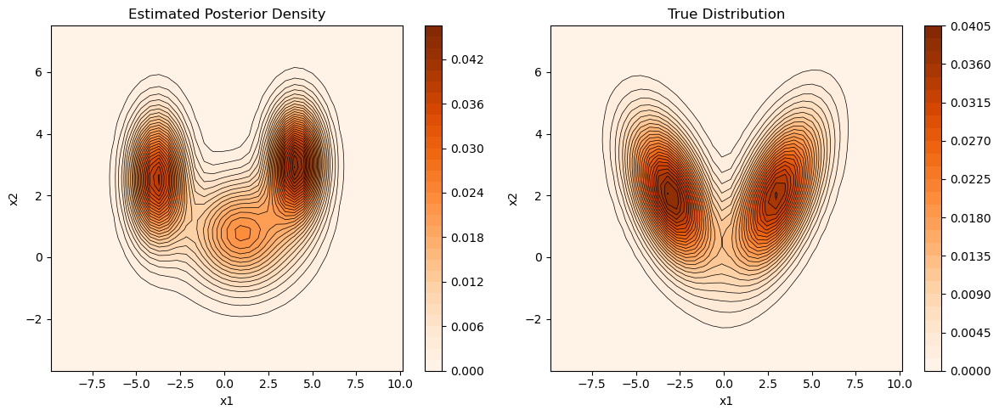

Iter 6, 2000: ELBO = -0.02049555218037291
Iter 6, 4000: ELBO = -0.021201577474288413


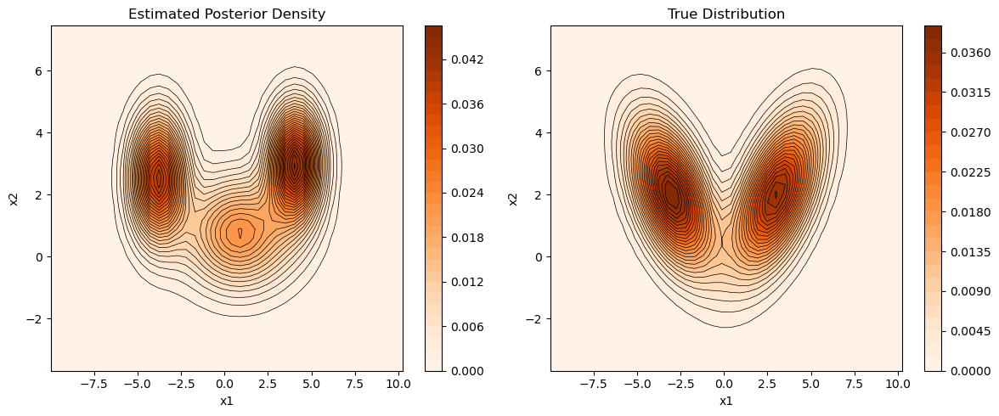


Best ELBO: -0.02049555218037291
Parameter     Optimized         True
----------------------------------------
mu1_1           -3.8104      -3.0000
mu2_1            2.5501       2.0000
mu3_1            4.0817       3.0000
mu1_2            3.0290       2.0000
mu2_2            0.9110       2.3000
mu3_2            0.7680      -1.1000
sigma1_1         1.0602      -1.1000
sigma2_1         1.7042       2.3000
sigma3_1         1.0108       2.6000
sigma1_2         1.4152       1.4000
sigma2_2         4.0542       1.4000
sigma3_2         1.3237       2.6000


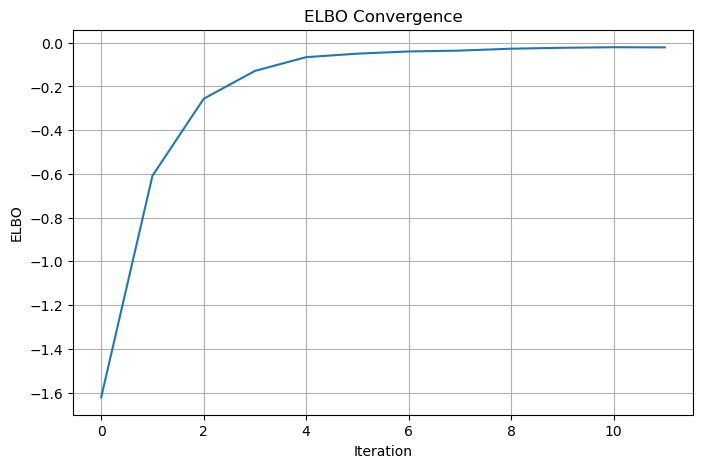

In [99]:
# Initial parameters for 2D
mu_initial = jnp.array([[-6.0, 6.0], [7.5, 4.0], [3.0, -3.0]])
s_initial = jnp.array([[1.0, 1.0], [2.0, 2.0], [1.0, 1.0]])

# Stack mu and log(s) for VBMC
params = jnp.array([mu_initial, jnp.log(s_initial)])
grad_elbo = jit(grad(elbo))

# Random key
key = jax.random.PRNGKey(0)
params, best_elbo, elbo_history = vbmc1(x, y, params, grad_elbo, s=s, L=L, lr=0.0015,
                                        n1=6, n2=4_000, plots=True, key=key)


# Number of components
n_components = mu_initial.shape[0]

# Optimized parameters
mu_opt = params[0]
s_opt = jnp.exp(params[1])

# Create names dynamically per component and dimension
param_names = [f"mu{i+1}_1" for i in range(n_components)] + \
              [f"mu{i+1}_2" for i in range(n_components)] + \
              [f"sigma{i+1}_1" for i in range(n_components)] + \
              [f"sigma{i+1}_2" for i in range(n_components)]

# Flatten optimized and true values
optimized_vals = jnp.concatenate([mu_opt.flatten(), s_opt.flatten()])
true_vals = jnp.concatenate([mu_true.flatten(), s_true.flatten()])

# Print results
print()
print("Best ELBO:", best_elbo)
print(f"{'Parameter':<10} {'Optimized':>12} {'True':>12}")
print("-"*40)
for name, opt, true in zip(param_names, optimized_vals, true_vals):
    print(f"{name:<10} {float(opt):12.4f} {float(true):12.4f}")


# Plot ELBO history
plt.figure(figsize=(8,5))
plt.plot(elbo_history)
plt.grid(True)
plt.xlabel("Iteration")
plt.ylabel("ELBO")
plt.title("ELBO Convergence")
plt.show()

In [101]:
#returns new gp points        
def active_sample(x, y, proposed_points, params_true, params_q, s, L, alpha=1, beta=1, gamma=1, n_points=1):
    mu_q = params_q[0]
    s_q = params_q[1]
    
    n_prop = proposed_points.shape[0]
    acquisition_values = jnp.zeros((n_points, n_prop))
    
    for i in range(n_points):
        grad_fn = grad(neg_gp_likelihood)
        init_params = jnp.concatenate([jnp.ravel(s), jnp.ravel(L)])
        res = minimize(
            fun=lambda p: float(neg_gp_likelihood(p, x, y, rbf)),
            x0=init_params,
            jac=lambda p: jnp.array(grad_fn(p, x, y, rbf)),
            method="L-BFGS-B",
            bounds=[(1, 12)]*len(init_params)
        )
        #update GP hyperparameters
        s = res.x[0]
        # L = jnp.diag(res.x[1:])
        L = res.x[1:]
        
        #GP predictions at proposed points
        mu, var = gp_predict(x, y, proposed_points, kernel=rbf, s=s, L=L)
        var = jnp.diag(var)
        
        #mixture PDF at proposed points
        q = mixture_pdf(proposed_points, mu_q, s_q)
        f_exp = jnp.exp(mu)
        
        acquisition_values = acquisition_values.at[i].set(var**alpha * q**beta * f_exp**gamma)
        
        # select next point
        best_idx = jnp.argmax(acquisition_values[i])
        x_new = proposed_points[best_idx].reshape(1,2)
        y_new = expensive_log_likelihood(x_new, params_true).reshape(1)
        
        x = jnp.vstack([x, x_new])
        y = jnp.concatenate([y, y_new])

    return x, y, s, L, acquisition_values

    
def vbmc2(x, y, params, grad_elbo, s, L, alpha=1, 
          beta=1, gamma=1, lr=0.005, n_points=1, 
          n1=10, n2=20_000, plots=True, 
          real_log_likelihood=None, key=None):
    elbo_history = []
    best_elbo = -jnp.inf
    best_params = params.copy()

    for j in range(n1):
        for i in range(n2):
            key, _ = jax.random.split(key)
            grads = grad_elbo(params, x, y, s, L, key=key)
            params = params - lr*grads

            if (i+1) % (n2/2) == 0:
                current_elbo = -elbo(params, x, y, s, L, key=key, random=False)
                elbo_history.append(current_elbo)
                if current_elbo > best_elbo:
                    best_elbo = current_elbo
                    best_params = params.copy()
                print(f"Iter {j+1}, {i+1}: ELBO = {current_elbo}")

        mu_opt = params[0]
        s_opt = jnp.exp(params[1])
        # Include evaluated points x in the plotting bounds
        all_x1 = jnp.concatenate([mu_opt[:, 0] - 3*jnp.mean(s_opt[:, 0]), mu_opt[:, 0] + 3*jnp.mean(s_opt[:, 0]), x[:, 0]])
        all_x2 = jnp.concatenate([mu_opt[:, 1] - 3*jnp.mean(s_opt[:, 1]), mu_opt[:, 1] + 3*jnp.mean(s_opt[:, 1]), x[:, 1]])

        lower1 = jnp.min(all_x1)
        upper1 = jnp.max(all_x1)
        lower2 = jnp.min(all_x2)
        upper2 = jnp.max(all_x2)

        #Define a 2D grid for active sampling
        x1_eval = jnp.linspace(lower1, upper1, 30)
        x2_eval = jnp.linspace(lower2, upper2, 30)
        X1_eval, X2_eval = jnp.meshgrid(x1_eval, x2_eval)
        proposed_points = jnp.column_stack([X1_eval.ravel(), X2_eval.ravel()])

        #Active sampling step
        s = jnp.atleast_1d(s)
        x, y, s, L, acquisition_values = active_sample(
            x, y, proposed_points, params_true, best_params, s, L, alpha, beta, gamma, n_points
        )

        if plots:
            n_subplots = 2
            if n_points > 0:
                n_subplots += 1
            if real_log_likelihood is not None:
                n_subplots += 2

            fig, axes = plt.subplots(1, n_subplots, figsize=(6*n_subplots, 6))
            if n_subplots == 1:
                axes = [axes]

            subplot_idx = 0

            # Acquisition function heatmap (if active sampling)
            if n_points > 0:
                acq_grid = acquisition_values[-1].reshape(X1_eval.shape)
                axes[subplot_idx].contourf(X1_eval, X2_eval, acq_grid, levels=30, cmap='magma')
                axes[subplot_idx].contour(X1_eval, X2_eval, acq_grid, levels=30, colors='black', linewidths=0.5)
                axes[subplot_idx].set_title("Acquisition Function (last iteration)")
                axes[subplot_idx].set_xlabel("x1")
                axes[subplot_idx].set_ylabel("x2")
                subplot_idx += 1

            #Mixture PDF
            mixture_vals = jax.vmap(lambda x: mixture_pdf(x, mu_opt, s_opt))(proposed_points)
            mixture_grid = mixture_vals.reshape(X1_eval.shape)
            axes[subplot_idx].contourf(X1_eval, X2_eval, mixture_grid, levels=30, cmap='Oranges')
            axes[subplot_idx].contour(X1_eval, X2_eval, mixture_grid, levels=30, colors='black', linewidths=0.5)
            axes[subplot_idx].set_title("Current Mixture PDF")
            axes[subplot_idx].set_xlabel("x1")
            axes[subplot_idx].set_ylabel("x2")
            subplot_idx += 1

            #True Dist
            if real_log_likelihood is not None:
                real_log_likelihood = real_log_likelihood.ravel()
                realmix = jnp.exp(real_log_likelihood)
                realmix = realmix.reshape(X1_eval.shape)

                axes[subplot_idx].contourf(X1_eval, X2_eval, realmix.reshape(X1_eval.shape),
                                        levels=30, cmap='Oranges')
                axes[subplot_idx].contour(X1_eval, X2_eval, realmix.reshape(X1_eval.shape),
                                        levels=30, colors='black', linewidths=0.5)
                axes[subplot_idx].set_title("True Mixture")
                axes[subplot_idx].set_xlabel("x1")
                axes[subplot_idx].set_ylabel("x2")
                subplot_idx += 1

            # GP surrogate mean
            mu_eval, var_eval = gp_predict(x, y, proposed_points, kernel=rbf, s=s, L=L)
            mu_eval_grid = mu_eval.reshape(X1_eval.shape)
            axes[subplot_idx].contourf(X1_eval, X2_eval, mu_eval_grid, levels=30, cmap='Oranges')
            axes[subplot_idx].contour(X1_eval, X2_eval, mu_eval_grid, levels=30, colors='black', linewidths=0.5)
            axes[subplot_idx].scatter(x[:,0], x[:,1], c='red', s=20, label='Observed')
            axes[subplot_idx].set_title("GP Surrogate Mean")
            axes[subplot_idx].set_xlabel("x1")
            axes[subplot_idx].set_ylabel("x2")
            subplot_idx += 1

            # Real log likelihood (optional)
            if real_log_likelihood is not None:
                axes[subplot_idx].contourf(X1_eval, X2_eval, real_log_likelihood.reshape(X1_eval.shape),
                                        levels=30, cmap='Oranges')
                axes[subplot_idx].contour(X1_eval, X2_eval, real_log_likelihood.reshape(X1_eval.shape),
                                        levels=30, colors='black', linewidths=0.5)
                axes[subplot_idx].set_title("True Log Likelihood")
                axes[subplot_idx].set_xlabel("x1")
                axes[subplot_idx].set_ylabel("x2")

            plt.tight_layout()
            plt.show()


    return best_params, best_elbo, elbo_history

Iter 1, 1500: ELBO = 4.2166482727877845
Iter 1, 3000: ELBO = 4.709991337477591


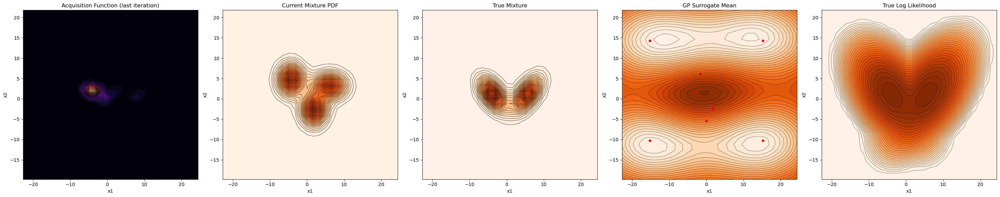

Iter 2, 1500: ELBO = 0.0294096810697555
Iter 2, 3000: ELBO = 0.2809047954337087


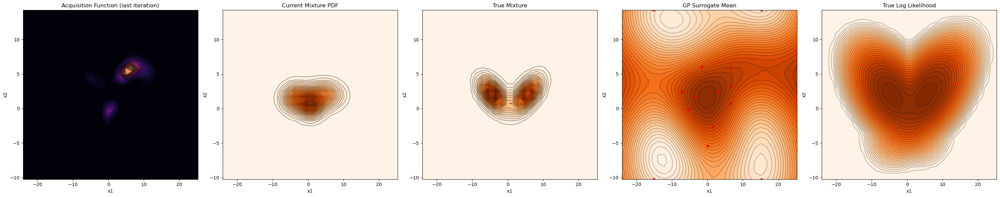

Iter 3, 1500: ELBO = 0.4968135033773837
Iter 3, 3000: ELBO = 0.6124727679210409


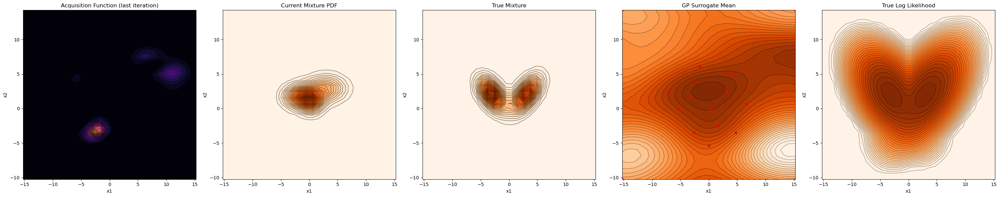

Iter 4, 1500: ELBO = 0.5757955754508801
Iter 4, 3000: ELBO = 0.5957633071675454


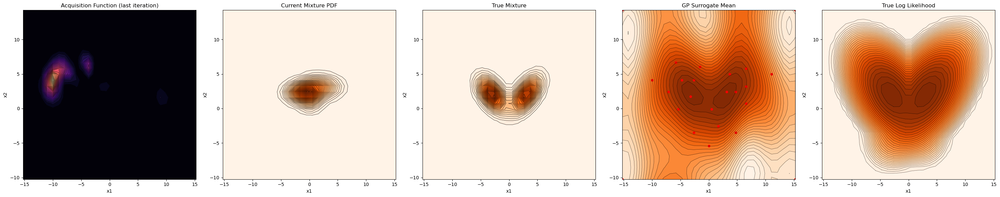

Iter 5, 1500: ELBO = -0.1843092064429097
Iter 5, 3000: ELBO = -0.09534073867394977


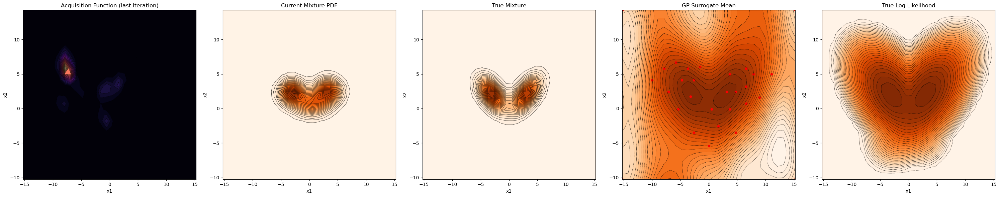

Iter 6, 1500: ELBO = -0.08221050400167673
Iter 6, 3000: ELBO = -0.06763135098948592


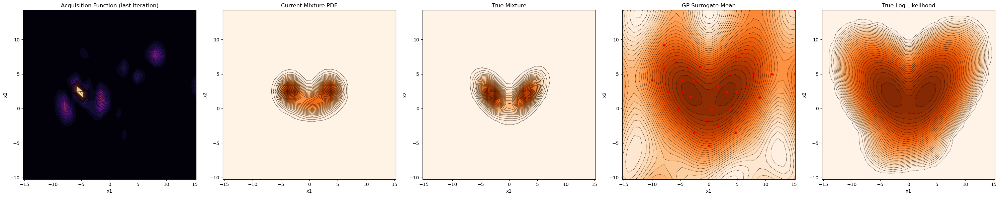

Iter 7, 1500: ELBO = -0.05016355189055677
Iter 7, 3000: ELBO = -0.05625826075310236


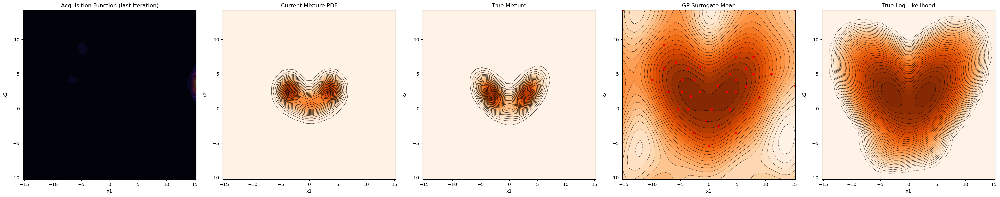

Iter 8, 1500: ELBO = -0.03760763720026272
Iter 8, 3000: ELBO = -0.03624752430533462


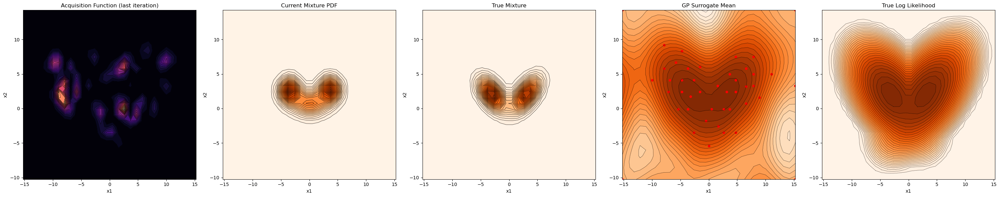

Iter 9, 1500: ELBO = -0.033425183858030394
Iter 9, 3000: ELBO = -0.031715616898757126


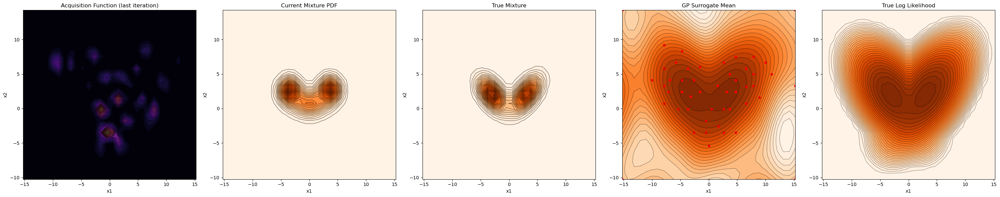

Iter 10, 1500: ELBO = -0.03571867391754768
Iter 10, 3000: ELBO = -0.0346064652593272


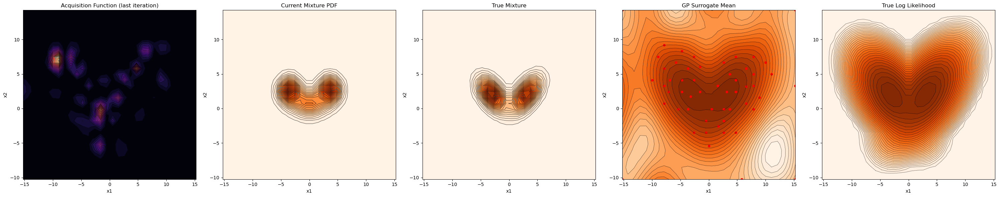


Best ELBO: 4.709991337477591
Parameter     Optimized         True
----------------------------------------
mu1_1           -4.3292      -3.0000
mu2_1            4.7150       2.0000
mu3_1            6.0638       3.0000
mu1_2            3.1600       2.0000
mu2_2            1.8786       2.3000
mu3_2           -2.6739      -1.1000
sigma1_1         5.1304      -1.1000
sigma2_1         6.3341       2.3000
sigma3_1         8.3519       2.6000
sigma1_2         4.4399       1.4000
sigma2_2         4.9088       1.4000
sigma3_2         6.3139       2.6000


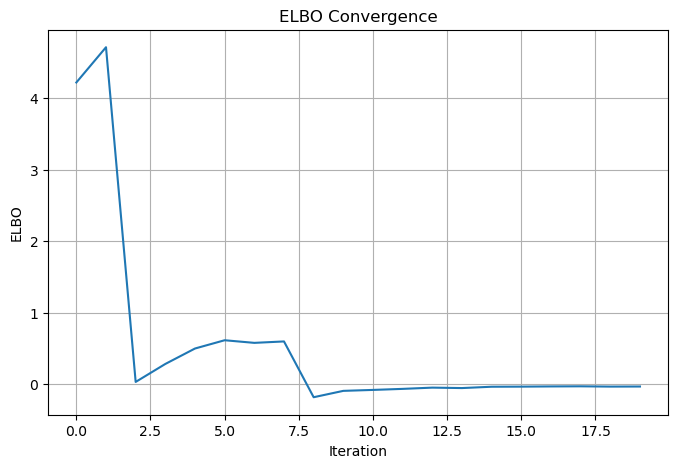

In [102]:
# Initial parameters for 2D
mu_initial = jnp.array([[-6.0, 6.0], [7.5, 4.0], [3.0, -3.0]])
s_initial = jnp.array([[1.0, 1.0], [2.0, 2.0], [1.0, 1.0]])

# Stack mu and log(s) for VBMC
params = jnp.array([mu_initial, jnp.log(s_initial)])
grad_elbo = jit(grad(elbo))

# Random key
key = jax.random.PRNGKey(0)
params, best_elbo, elbo_history = vbmc2(x, y, params, grad_elbo, s=s, L=L, alpha=2, 
                                        beta=0.5, gamma=1, lr=0.005, n_points=5, 
                                        n1=10, n2=3_000, plots=True, 
                                        real_log_likelihood=real_log_likelihood, key=key)


# Number of components
n_components = mu_initial.shape[0]

# Optimized parameters
mu_opt = params[0]
s_opt = jnp.exp(params[1])

# Create names dynamically per component and dimension
param_names = [f"mu{i+1}_1" for i in range(n_components)] + \
              [f"mu{i+1}_2" for i in range(n_components)] + \
              [f"sigma{i+1}_1" for i in range(n_components)] + \
              [f"sigma{i+1}_2" for i in range(n_components)]

# Flatten optimized and true values
optimized_vals = jnp.concatenate([mu_opt.flatten(), s_opt.flatten()])
true_vals = jnp.concatenate([mu_true.flatten(), s_true.flatten()])

# Print results
print()
print("Best ELBO:", best_elbo)
print(f"{'Parameter':<10} {'Optimized':>12} {'True':>12}")
print("-"*40)
for name, opt, true in zip(param_names, optimized_vals, true_vals):
    print(f"{name:<10} {float(opt):12.4f} {float(true):12.4f}")


# Plot ELBO history
plt.figure(figsize=(8,5))
plt.plot(elbo_history)
plt.grid(True)
plt.xlabel("Iteration")
plt.ylabel("ELBO")
plt.title("ELBO Convergence")
plt.show()